In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

In [73]:
def build_afc(a, b, name, cheb=False):
  
  fig, axs = plt.subplots(1, 1,  figsize=([10, 5]))

  if (cheb):
    w, h = signal.freqz(b, a)
    axs.semilogx(w / np.pi, 20 * np.log10(abs(h)))
    axs.set_xlabel('Normalized frequency')
    axs.set_ylabel('Amplitude [dB]')
    axs.grid(which='both', axis='both')
    axs.axis([0.08, 1, -60, 3])
  else:
    w, h = signal.freqs(b, a)

    axs.semilogx(w, 20 * np.log10(abs(h)))
    axs.set_xlabel('Frequency [radians / second]')
    axs.set_ylabel('Amplitude [dB]')
    axs.grid(which='both', axis='both')

  axs.set_title(f'Amplitude-Frequency Characteristic - {name}')

Questions:

1. Age
2. Gender: female / male (put ring around what fits)

How many hours do you spend on average per week to:

3. listen to music
4. play / produce / compose music
5. dance (both as training and at a party)
6. train (other than dance)


7. Do you think it was tiring?
8. How much did you feel moving (compared to standing still)?
9. Did you find that you moved more while listening to music?
10. Did you keep your eyes open?
11. Did you lock your knees?


In [52]:
def build_signal_fft(sig, t_seq, name, build_phase=False,  sr=128, ts=1):
  rfft_sig = np.fft.rfft(sig)
  mag_spectrum = np.abs(rfft_sig)

  xf = np.fft.rfftfreq(sr*ts, 1 / sr)

  ft = np.fft.fft(sig)

  half_len = int(len(t_seq) / 2)

  if (build_phase):
    fig, axs = plt.subplots(3, 1,  figsize=([20, 16]))
  else:
    fig, axs = plt.subplots(2, 1,  figsize=([20, 13]))

  plt.locator_params(axis='x', nbins=40)

  axs[0].set_title(f'Input signal - {name}')
  axs[0].plot(t_seq, sig, color = 'r', label='Filtered signal')
  axs[0].set_xlabel('Time (s)')
  axs[0].set_ylabel('Amplitude (mm)')
  axs[0].legend(bbox_to_anchor=[1, 1],
                  ncol=2, title="Legend")
  axs[0].grid(True)

  axs[1].set_title(f'Amplitude spectrum - {name}')
  axs[1].stem(xf, mag_spectrum, markerfmt=None)
  axs[1].set_xlabel('Frequency (Hz)')
  axs[1].set_ylabel('Amplitude ')
  axs[1].legend(bbox_to_anchor=[1, 1],
                  ncol=2, title="Legend")
  axs[1].grid(True)


  if (build_phase):
    phase = np.angle(ft)

    axs[2].set_title(f'Phase spectrum - {name}')
    axs[2].stem(t_seq, phase)
    axs[2].set_xlabel('Frequency (Hz)')
    axs[2].set_ylabel('Phase ')
    axs[2].legend(bbox_to_anchor=[1, 1],
                    ncol=2, title="Legend")
    axs[2].grid(True)


# Initial data loadings
human_idx = '01'


filename = f'./data/movement_data/NM00{human_idx}.tsv'
markers = {'01': 12}
fs = 100
rows_num = 36000
axes = ['X', 'Y', 'Z']
human = 1

df = pd.read_csv(filename, delimiter='\t', encoding='utf-8', skiprows=10, low_memory=False)

In [9]:
# Dict with data for 1 experiment
raw_data = {}
# Human_idx in raw data to find markers(people) count

# Separate different people and add time column
for m in range(1, markers[human_idx] + 1):
  time = np.linspace(0, rows_num / fs, rows_num)
  human_df = df[[f'S{m} X', f'S{m} Y', f'S{m} Z']]
  human_df.columns = axes
  human_df.insert(0, 'Time (s)', time)
  raw_data[m] = human_df

# Calculate displacement (difference before two positions)
for m in range(1, markers[human_idx]):
  for position in axes:
    displ = np.roll(raw_data[m][position], -1) - raw_data[m][position]
    displ = displ.drop(displ.index[len(displ)-1])
    raw_data[m].insert(0, f'd{position}', displ)

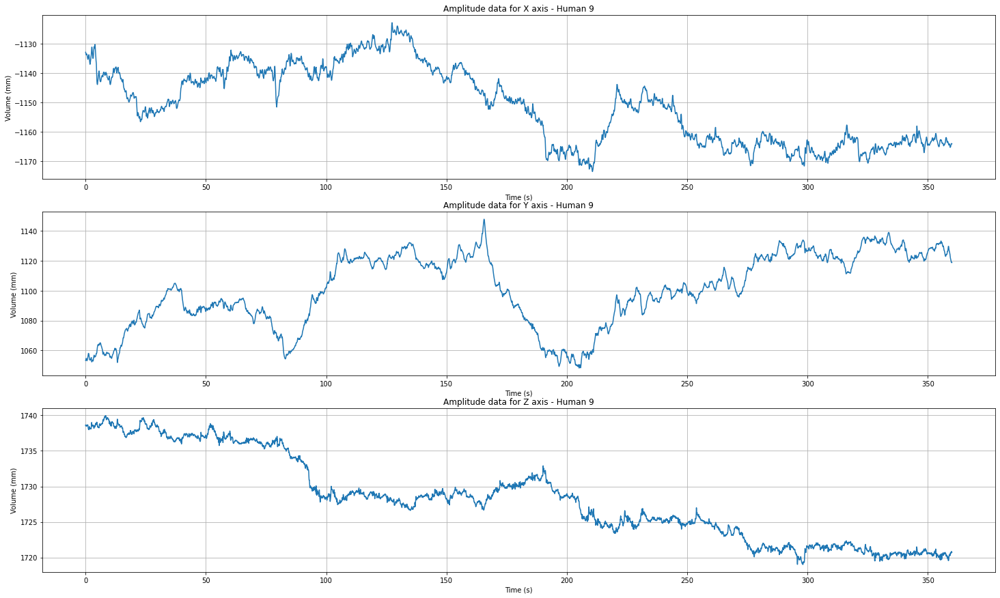

In [10]:
# Plot current data
fig, axs = plt.subplots(3, 1,  figsize=(25 ,15))
# axs[0].plot(raw_data[human]['Time (s)'], raw_data[human]['dX'], label='Sick EEG')
axs[0].plot(raw_data[human]['Time (s)'], raw_data[human]['X'], label='Sick EEG')

axs[0].set_title('Amplitude data for X axis - Human 9')
axs[0].set_xlabel('Time (s)')
axs[0].set_ylabel('Volume (mm)')
axs[0].grid(True)

# axs[1].plot(raw_data[human]['Time (s)'], raw_data[human]['dY'], label='Sick EEG')
axs[1].plot(raw_data[human]['Time (s)'], raw_data[human]['Y'], label='Sick EEG')

axs[1].set_title('Amplitude data for Y axis - Human 9')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Volume (mm)')
axs[1].grid(True)

# axs[2].plot(raw_data[human]['Time (s)'], raw_data[human]['dZ'], label='Sick EEG')
axs[2].plot(raw_data[human]['Time (s)'], raw_data[human]['Z'], label='Sick EEG')

axs[2].set_title('Amplitude data for Z axis - Human 9')
axs[2].set_xlabel('Time (s)')
axs[2].set_ylabel('Volume (mm)')
axs[2].grid(True)

In [11]:
# Read music sequence data and devide dataset in those
stimuli_df = pd.read_csv('./data/sound_data/nm15_song_order.csv')

#First and last segments always were Silence - 60s
#1 - Middle Silence - 60s
#2 - Meditation - 60s
#3 - Salsa - 60s
#4 - EDM - 60s
#Total duration of recording 360s
stim_types = {0:'Silence 1', 1: 'Middle Silence', 2: 'Meditation', 3: 'Salsa', 4:'EDM', 5:'Silence 2'}
stimuli_df.head()

,1,2,3,4,5
0,A,3,1,2,4
1,B,1,2,4,3
2,C,1,2,3,4
3,D,2,3,4,1
4,E,1,2,3,4


In [12]:
stimuled_humans = {}
parts_amount = 6
ticks_per_60_second = fs * 60

# For each person in stage
for person in range(1, markers[human_idx] + 1):

  # Getting ready for stimules parts
  stimules = {
    0: None,
    1: None,
    2: None,
    3: None,
    4: None,
    5: None
  }

  # 0 and 5 are Silence
  stimuli_order = list(stimuli_df.iloc[int(human_idx) - 1])
  stimuli_order[0] = 5
  stimuli_order.append(0)

  print(stimuli_order)

  # Fill in different parts of signals for each stimuli type / silence
  for s in range(len(stimuli_order)):
    part = raw_data[person].iloc[stimuli_order[s] * ticks_per_60_second : (stimuli_order[s]+1) * ticks_per_60_second]
    stimules[s] = part

  stimuled_humans[person] = stimules

stimuled_humans[1][1]

[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]
[5, 3, 1, 2, 4, 0]


,dZ,dY,dX,Time (s),X,Y,Z
18000,-0.006,-0.080,-0.031,180.005000,-1149.069,1089.637,1730.268
18001,-0.006,-0.074,-0.024,180.015000,-1149.100,1089.557,1730.262
18002,-0.002,-0.038,-0.033,180.025001,-1149.124,1089.483,1730.256
18003,-0.014,-0.045,-0.053,180.035001,-1149.157,1089.445,1730.254
18004,-0.037,-0.014,-0.072,180.045001,-1149.210,1089.400,1730.240
...,...,...,...,...,...,...,...
23995,0.013,0.019,-0.110,239.956665,-1150.961,1100.529,1724.918
23996,0.005,0.032,-0.096,239.966666,-1151.071,1100.548,1724.931
23997,0.002,0.015,-0.075,239.976666,-1151.167,1100.580,1724.936
23998,-0.013,0.024,-0.089,239.986666,-1151.242,1100.595,1724.938


/home/botsula/.local/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


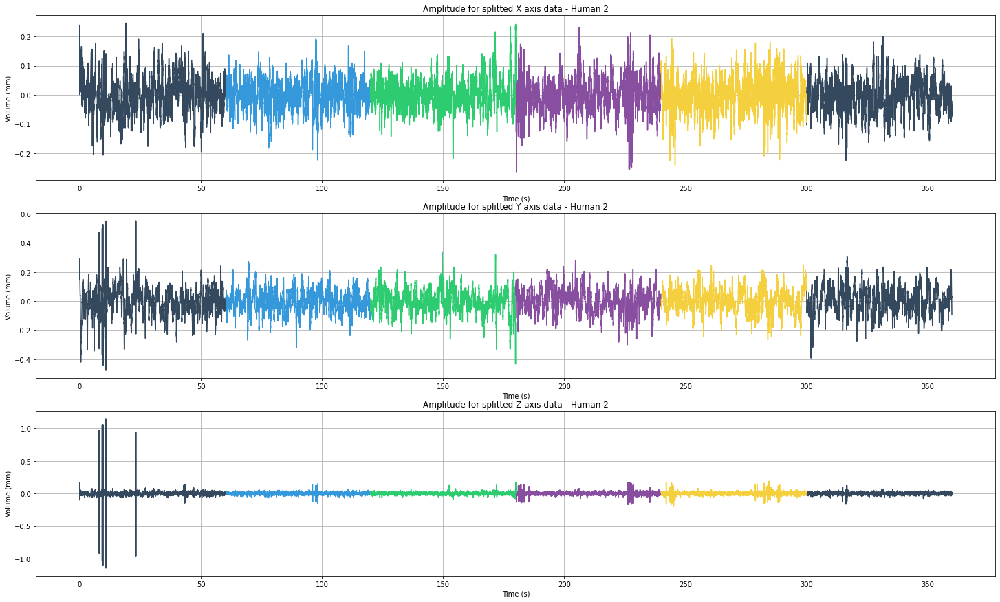

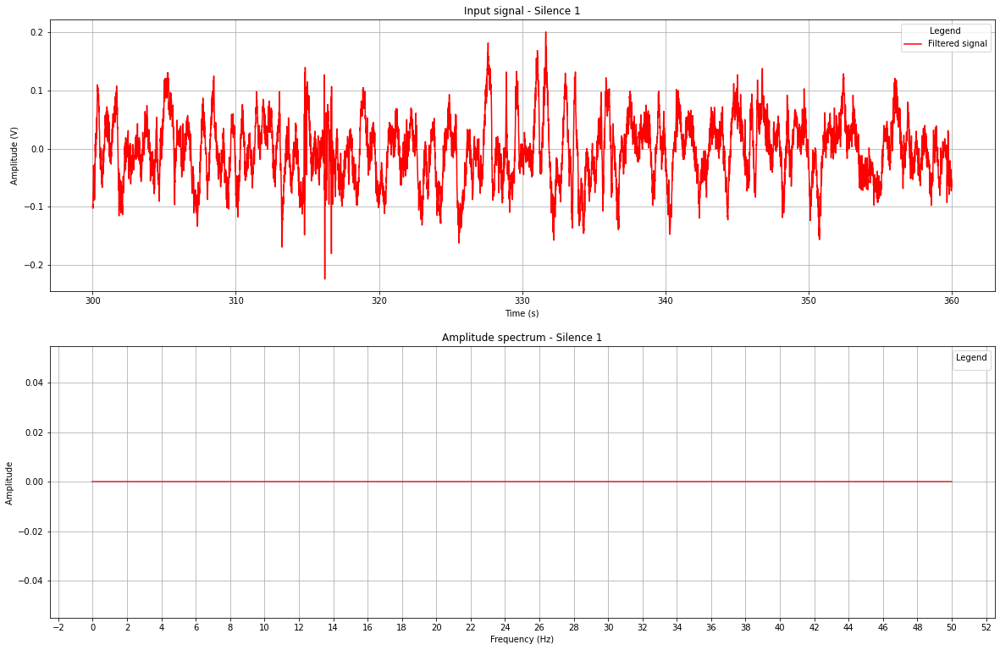

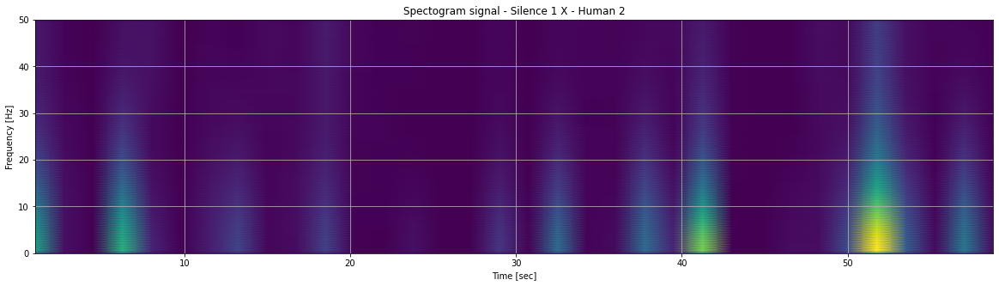

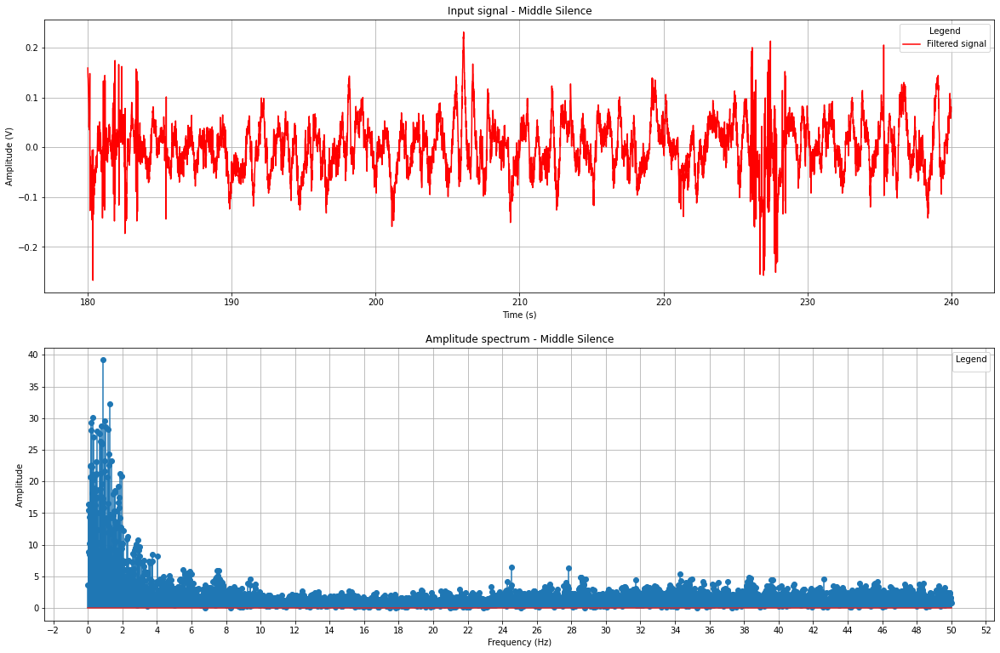

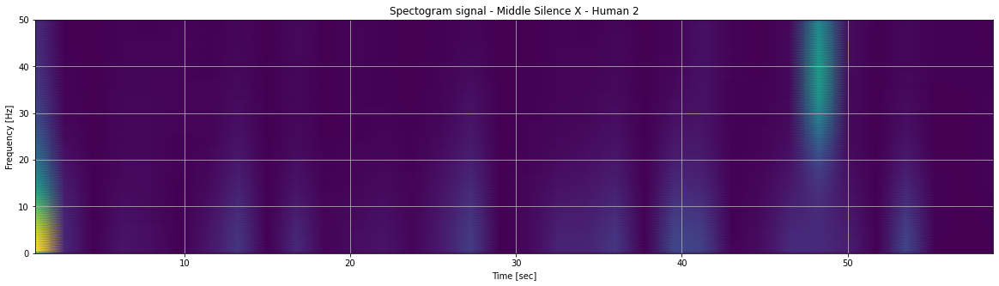

...

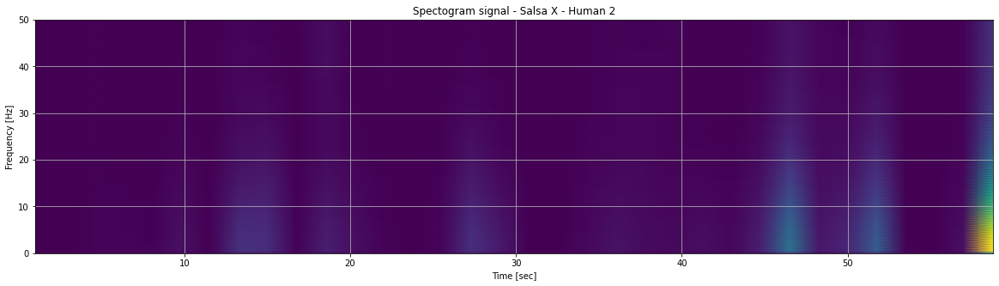

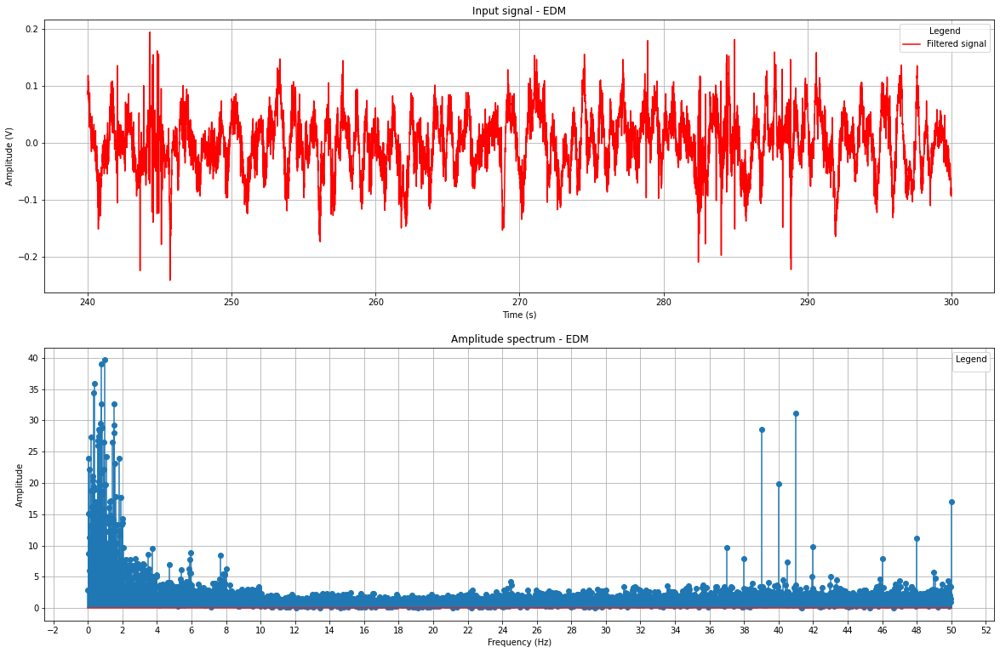

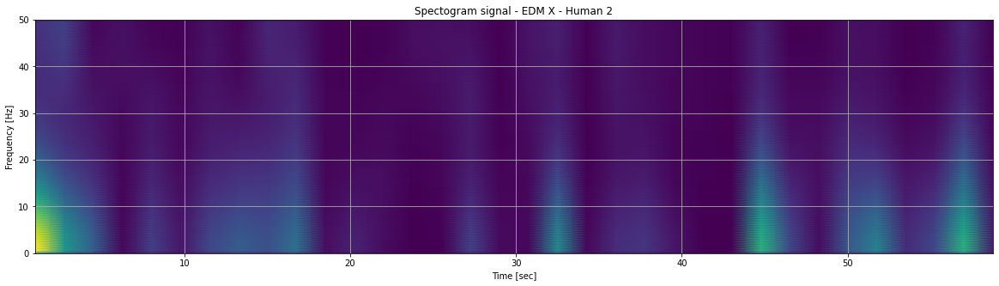

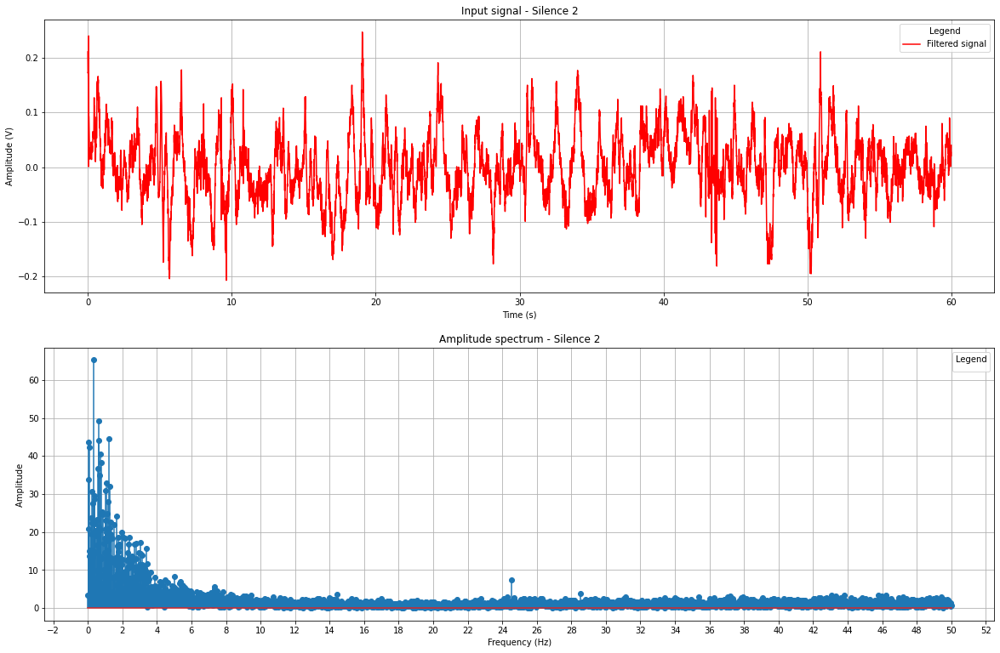

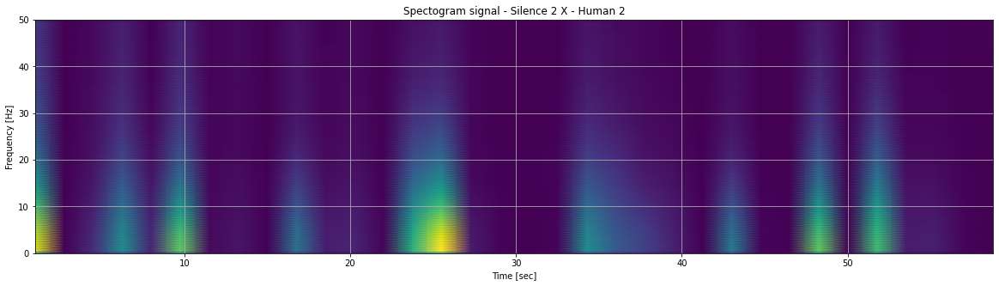

In [13]:
fig, axs = plt.subplots(3, 1,  figsize=(25 ,15))
sig_colors = ['#34495E', '#884EA0', '#3498DB', '#2ECC71', '#F4D03F', '#34495E']
human = 2
for i in range(parts_amount):
  color = '#555015'
  axs[0].plot(stimuled_humans[human][i]['Time (s)'], stimuled_humans[human][i]['dX'], color = sig_colors[i])
  axs[1].plot(stimuled_humans[human][i]['Time (s)'], stimuled_humans[human][i]['dY'], color = sig_colors[i])
  axs[2].plot(stimuled_humans[human][i]['Time (s)'], stimuled_humans[human][i]['dZ'], color = sig_colors[i])

for j in range(len(axes)):
  axs[j].set_title(f'Amplitude for splitted {axes[j]} axis data - Human {human}')
  axs[j].set_xlabel('Time (s)')
  axs[j].set_ylabel('Volume (mm)')
  axs[j].grid(True)

signals = [[stimuled_humans[human][i]['dX'], stimuled_humans[human][i]['Time (s)'], 60] for i in range(parts_amount)]
for i in range(parts_amount):
  build_signal_fft(stimuled_humans[human][i]['dX'], stimuled_humans[human][i]['Time (s)'], stim_types[i], sr=100, ts=60)

  f, t, Sxx = signal.spectrogram(np.array(signals[i][0]), 100, window=('exponential', 0.2), nperseg=200)
  # f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))
  fig, axs = plt.subplots(1, 1,  figsize=([20, 5]))
  axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
  axs.pcolormesh(t, f, Sxx, shading='gouraud')
  axs.set_xlabel('Time [sec]')
  axs.set_ylabel('Frequency [Hz]')
  axs.grid(True)


No handles with labels found to put in legend.
No handles with labels found to put in legend.


16 0.7000382151745453


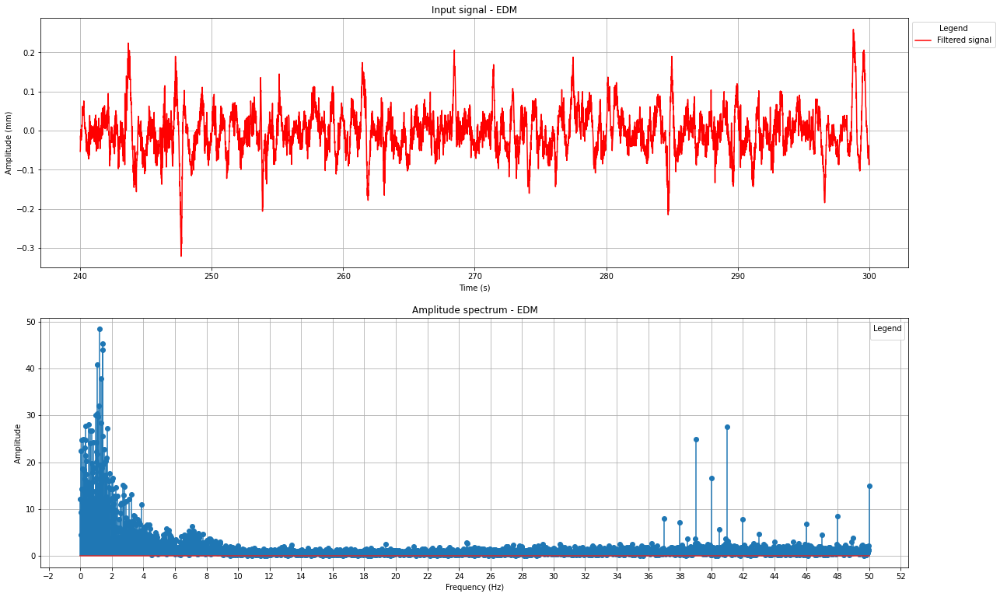

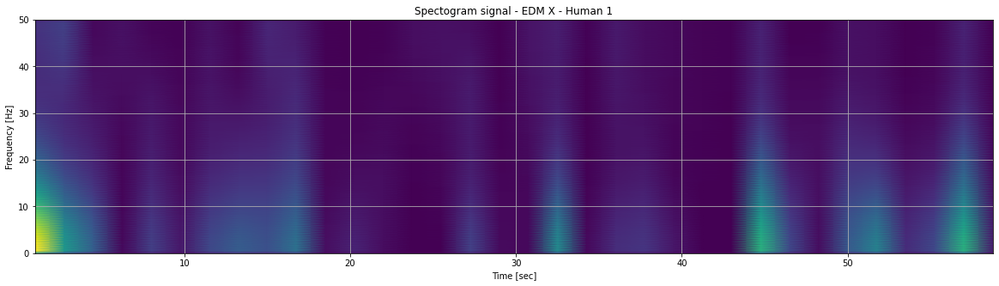

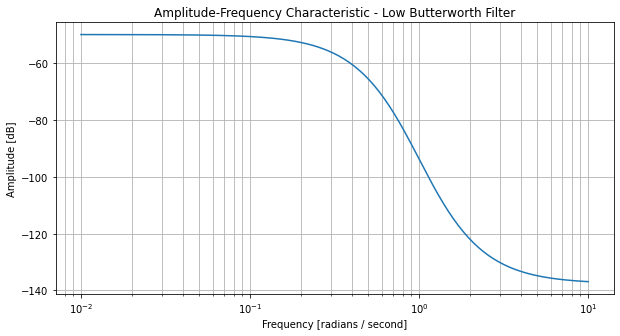

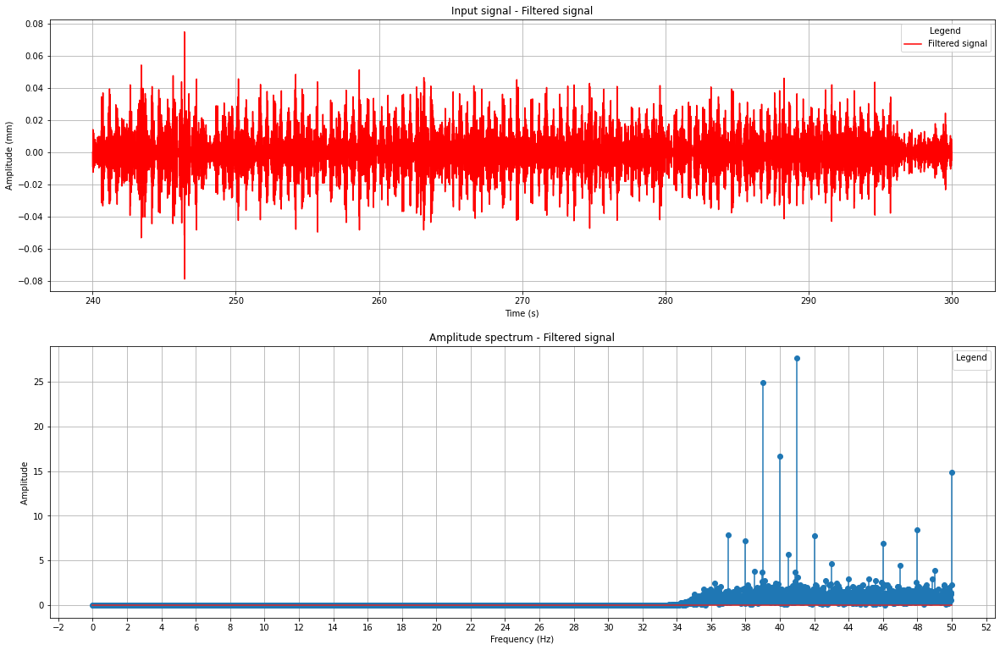

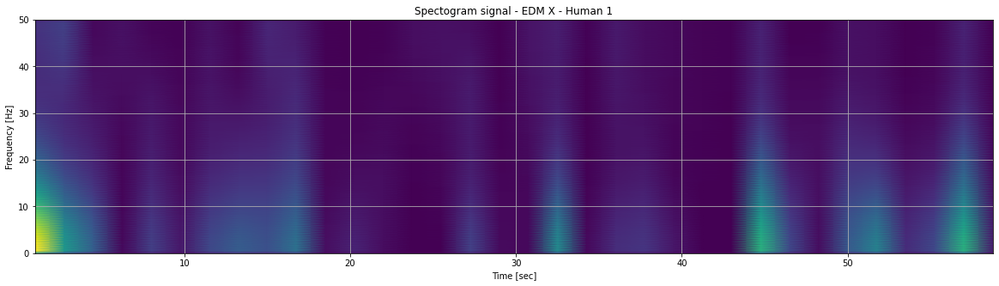

In [74]:
i = 4

build_signal_fft(stimuled_humans[human][i]['dX'], stimuled_humans[human][i]['Time (s)'], stim_types[i], sr=100, ts=60)

f, t, Sxx = signal.spectrogram(np.array(signals[i][0]), 100, window=('exponential', 0.2), nperseg=200)
# f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))
fig, axs = plt.subplots(1, 1,  figsize=([20, 5]))
axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
axs.pcolormesh(t, f, Sxx, shading='gouraud')
axs.set_xlabel('Time [sec]')
axs.set_ylabel('Frequency [Hz]')
axs.grid(True)


# Filter
# N, Wn = signal.buttord([0.1, 0.3], [0.05, 0.4], gpass=0.5, gstop=100)
# b, a = signal.butter(N, Wn, 'bandstop')

N, Wn = signal.buttord( wp=0.7, ws=0.8, gpass=3, gstop=60)
b, a = signal.butter(N, Wn, 'high')
build_afc(a, b, 'High Butterworth Filter')

y = signal.filtfilt(b, a, stimuled_humans[human][i]['dX'])
build_signal_fft(y, stimuled_humans[human][i]['Time (s)'], 'Filtered signal',sr=100,  ts=60)
print(N, Wn)

f, t, Sxx = signal.spectrogram(np.array(signals[i][0]), 100, window=('exponential', 0.2), nperseg=200)
# f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))
fig, axs = plt.subplots(1, 1,  figsize=([20, 5]))
axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
axs.pcolormesh(t, f, Sxx, shading='gouraud')
axs.set_xlabel('Time [sec]')
axs.set_ylabel('Frequency [Hz]')
axs.grid(True)


In [14]:
# Create df with statistics (mean, std) for human
def create_statistics_human(stimuled_humans, human):
  statistics_for_human = {
    'stimul': [stim_types[i] for  i in range(parts_amount)],
    'X_avg': [np.mean(stimuled_humans[human][i]['dX']) for i in range(parts_amount)],
    'Y_avg': [np.mean(stimuled_humans[human][i]['dY']) for i in range(parts_amount)],
    'Z_avg': [np.mean(stimuled_humans[human][i]['dZ']) for i in range(parts_amount)],
    'X_std': [np.std(stimuled_humans[human][i]['dX']) for i in range(parts_amount)],
    'Y_std': [np.std(stimuled_humans[human][i]['dY']) for i in range(parts_amount)],
    'Z_std': [np.std(stimuled_humans[human][i]['dZ']) for i in range(parts_amount)]
  }

  statistics_for_human_df = pd.DataFrame(data=statistics_for_human)
  return statistics_for_human_df

# Plot dataframe made in create_statistics_human() 
def plot_stats(statistics_for_human_df, human):
  fig, axs = plt.subplots(2, 6, figsize=([30, 10]))
  for idx, row in statistics_for_human_df.iterrows():

    name = row['stimul']

    min_average = min([statistics_for_human_df['X_avg'].min(), statistics_for_human_df['Y_avg'].min(), statistics_for_human_df['Z_avg'].min()])
    max_average = max([statistics_for_human_df['X_avg'].max(), statistics_for_human_df['Y_avg'].max(), statistics_for_human_df['Z_avg'].max()])

    av = statistics_for_human_df.columns.delete(0)
    axs[0, idx].set_title(f'Mean - {name}')
    axs[1, idx].set_title(f'STD - {name}')

    axs[0, idx].bar(list(statistics_for_human_df.columns.delete(0))[:3], row.values[1:4], color=sig_colors[idx])
    axs[1, idx].bar(statistics_for_human_df.columns.delete(0)[:3], row.values[4:], color=sig_colors[idx])


    axs[0, idx].set_ylabel('Value')
    axs[1, idx].set_ylabel('Value')

    axs[0, idx].grid(True)
    axs[1, idx].grid(True)

    axs[0, idx].set_ylim([min_average, max_average])
    axs[1, idx].set_ylim([-0.01, 0.1])

  fig.savefig(f'./img/human_{human}.jpeg')

# STATISTICS PER SECONd

In [ ]:
# Create df with statistics (mean, std) for human
def create_statistics_human_second(stimuled_humans, human):
  statistics_for_human = {
    'stimul': [stim_types[i] for  i in range(parts_amount)],
    'X_avg': [np.mean(stimuled_humans[human][i]['dX']) for i in range(parts_amount)],
    'Y_avg': [np.mean(stimuled_humans[human][i]['dY']) for i in range(parts_amount)],
    'Z_avg': [np.mean(stimuled_humans[human][i]['dZ']) for i in range(parts_amount)],
    'X_std': [np.std(stimuled_humans[human][i]['dX']) for i in range(parts_amount)],
    'Y_std': [np.std(stimuled_humans[human][i]['dY']) for i in range(parts_amount)],
    'Z_std': [np.std(stimuled_humans[human][i]['dZ']) for i in range(parts_amount)]
  }

  statistics_for_human_df = pd.DataFrame(data=statistics_for_human)
  return statistics_for_human_df

# Plot dataframe made in create_statistics_human() 
def plot_stats_second(statistics_for_human_df, human):
  fig, axs = plt.subplots(2, 6, figsize=([30, 10]))
  for idx, row in statistics_for_human_df.iterrows():

    name = row['stimul']

    min_average = min([statistics_for_human_df['X_avg'].min(), statistics_for_human_df['Y_avg'].min(), statistics_for_human_df['Z_avg'].min()])
    max_average = max([statistics_for_human_df['X_avg'].max(), statistics_for_human_df['Y_avg'].max(), statistics_for_human_df['Z_avg'].max()])

    av = statistics_for_human_df.columns.delete(0)
    axs[0, idx].set_title(f'Mean - {name}')
    axs[1, idx].set_title(f'STD - {name}')

    axs[0, idx].bar(list(statistics_for_human_df.columns.delete(0))[:3], row.values[1:4], color=sig_colors[idx])
    axs[1, idx].bar(statistics_for_human_df.columns.delete(0)[:3], row.values[4:], color=sig_colors[idx])


    axs[0, idx].set_ylabel('Value')
    axs[1, idx].set_ylabel('Value')

    axs[0, idx].grid(True)
    axs[1, idx].grid(True)

    axs[0, idx].set_ylim([min_average, max_average])
    axs[1, idx].set_ylim([-0.01, 0.1])

  fig.savefig(f'./img/human_{human}.jpeg')

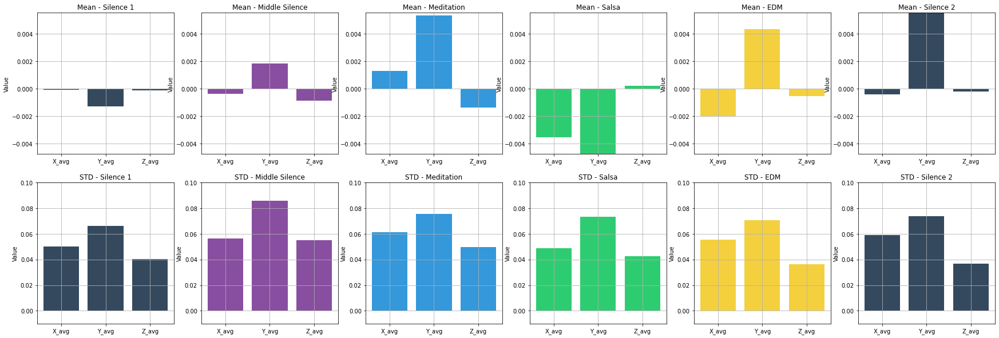

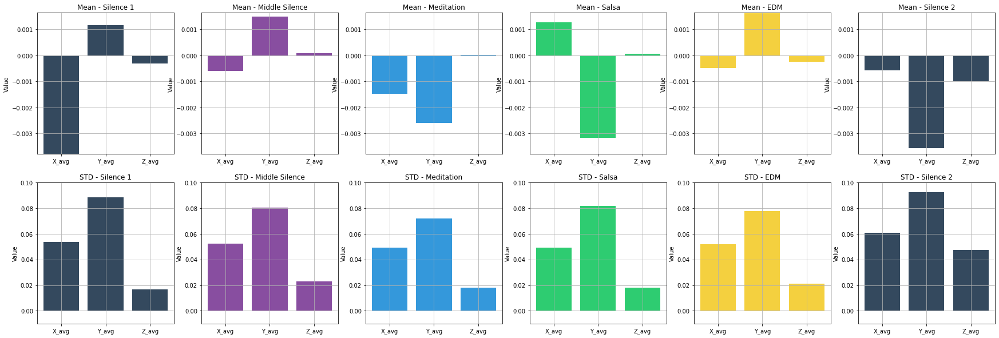

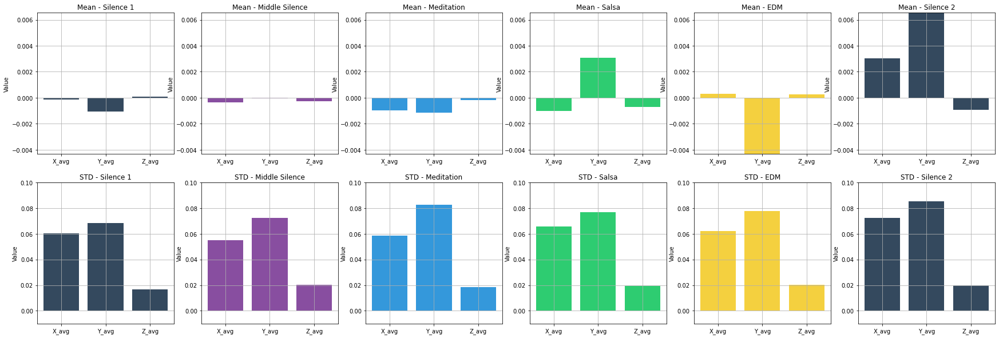

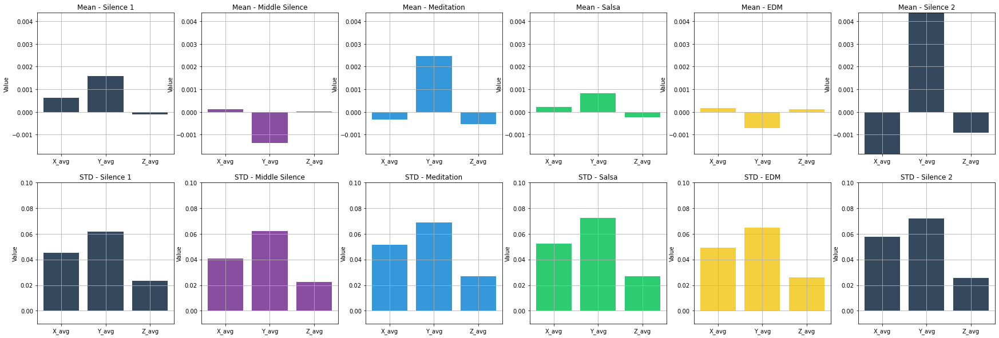

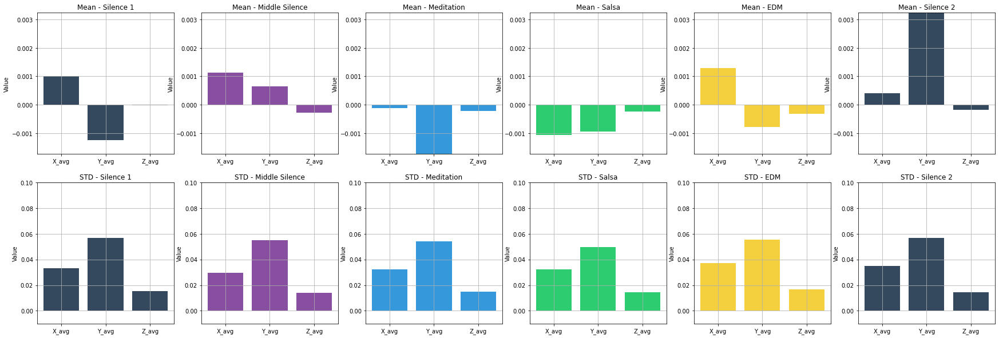

...

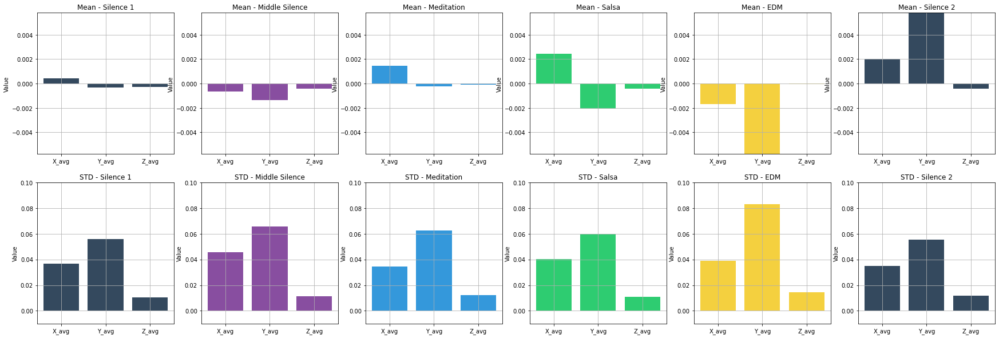

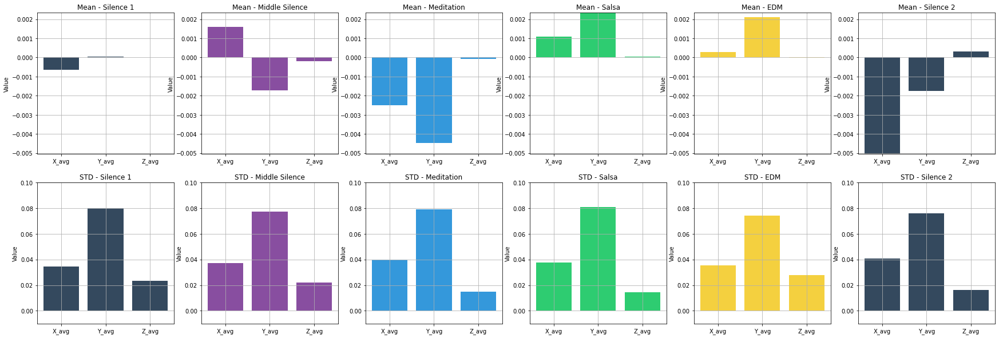

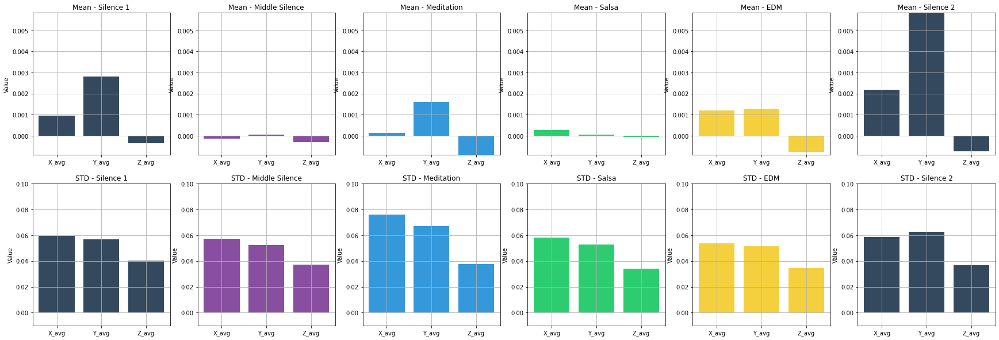

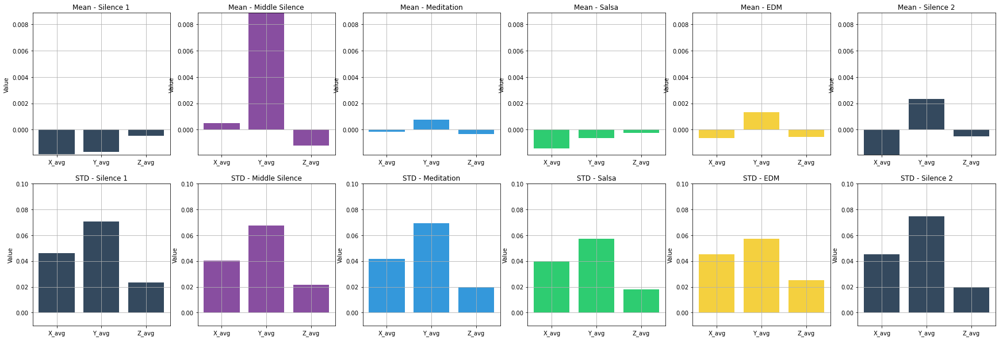

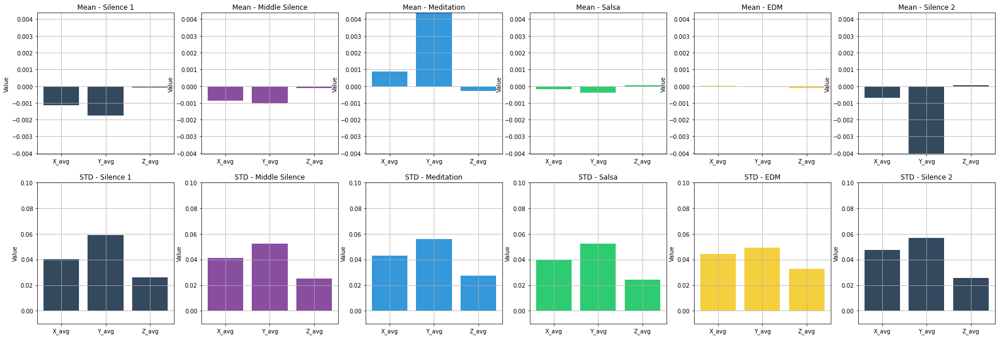

In [15]:
for i in range(1, 12):
  df = create_statistics_human(stimuled_humans, i)
  plot_stats(df, i)

In [158]:
def moving_average(a, n=3) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    # print(ret[:n])
    return ret[n - 1:] / n
    # return ret/ n


In [240]:
ma_coef = 50
human = 2
n = 0

def plot_and_find_ma(stimuled_humans, human, n):
  out_sig = moving_average(np.array(stimuled_humans[human][n]['dY']), ma_coef)
  fig, axs = plt.subplots(3, 1,  figsize=([30, 15]))


  max_v = max([stimuled_humans[human][n]['dX'].max(), stimuled_humans[human][n]['dY'].max(), stimuled_humans[human][n]['dZ'].max()])
  min_v = min([stimuled_humans[human][n]['dX'].min(), stimuled_humans[human][n]['dY'].min(), stimuled_humans[human][n]['dZ'].min()])


  for i in range(len(axes)):
    out_sig = moving_average(np.array(stimuled_humans[human][n][f'd{axes[i]}']), ma_coef)
    axs[i].set_title(f'Human: {human}, Stimul: {stim_types[n]}, Axis: {axes[i]}')
    axs[i].plot(stimuled_humans[human][n]['Time (s)'][ma_coef-1:], out_sig, color = 'r', label='Filtered signal')
    axs[i].set_xlabel('Time (s)')
    axs[i].set_ylabel('Amplitude (V)')
    # axs[i].set_ylim([min_v * 0.5,max_v * 0.5])
    axs[i].set_ylim([-0.3, 0.3])

    axs[i].grid(True)

    # f, t, Sxx = signal.spectrogram(np.array(stimuled_humans[human][n][f'd{axes[i]}']), 100)
    f, t, Sxx = signal.spectrogram(np.array(stimuled_humans[human][n][f'd{axes[i]}']), 100, window=('exponential', 0.5), nperseg=200)


    fg, ax = plt.subplots(1, 1,  figsize=([30, 5]))
    ax.set_title(f'Spectogram signal - 0.1s Window')
    ax.pcolormesh(t, f, Sxx, shading='gouraud')
    ax.set_xlabel('Time [sec]')
    ax.set_ylabel('Frequency [Hz]')
    ax.grid(True)

  fig.savefig(f'./img/MA_human_{human}_{stim_types[n]}.jpeg')



# out_sig



<ipython-input-240-1d3184eb9768>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(3, 1,  figsize=([30, 15]))


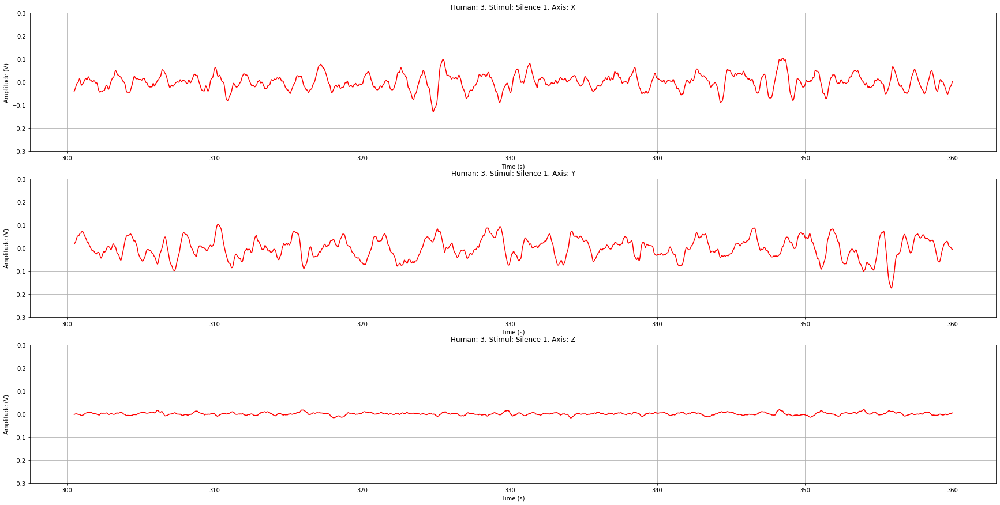

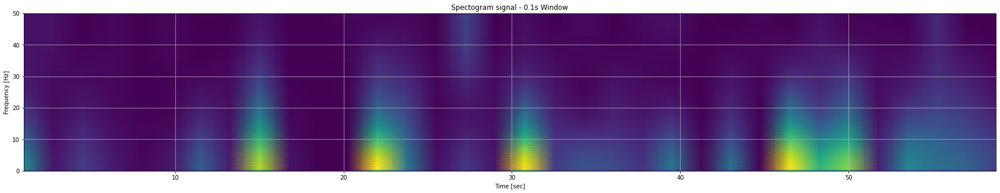

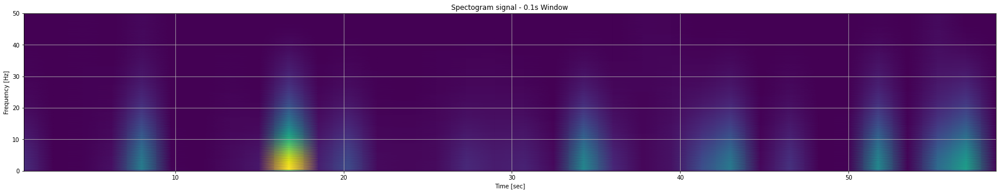

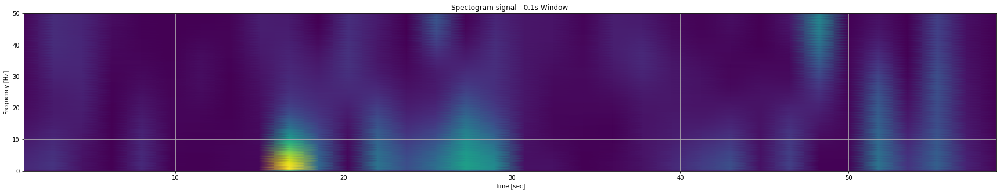

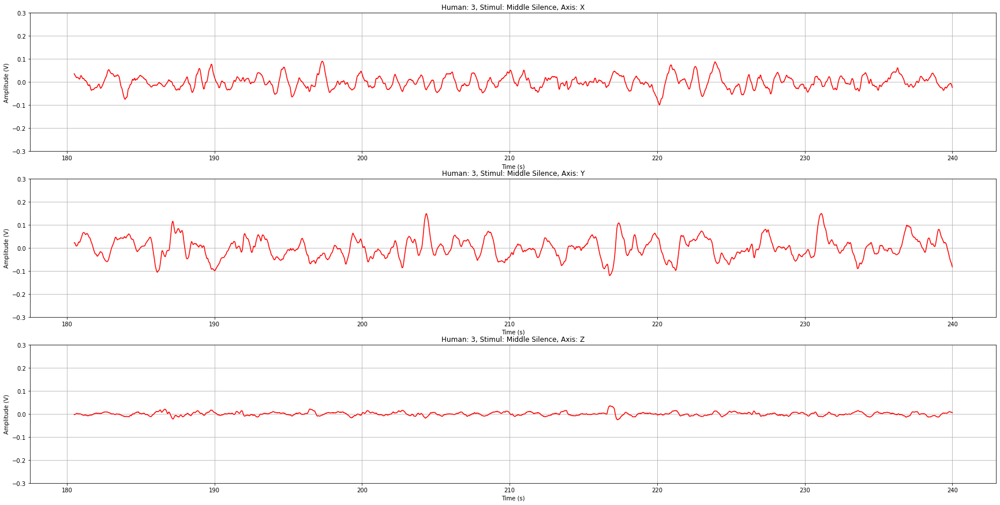

...

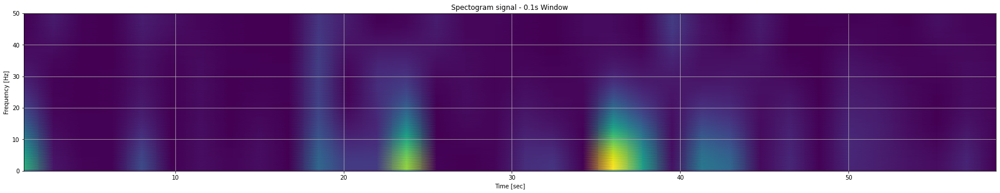

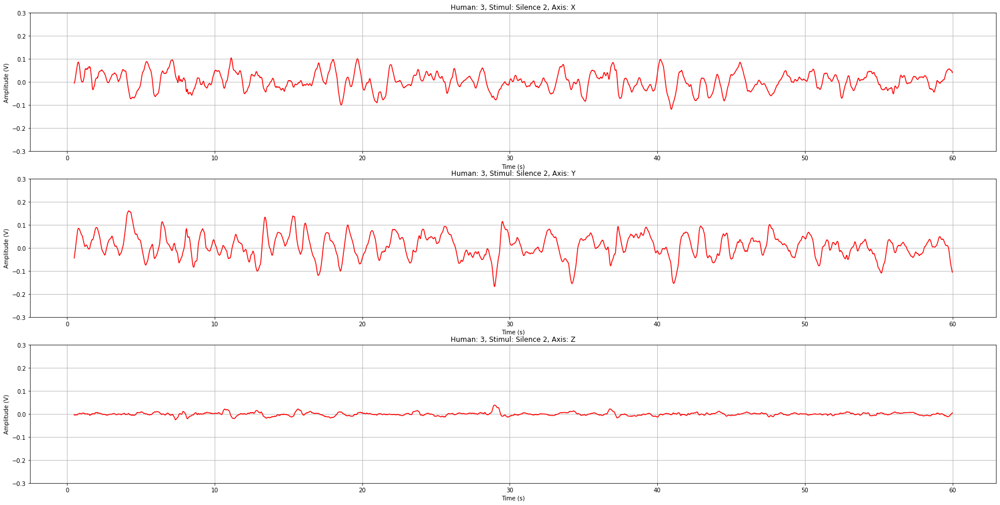

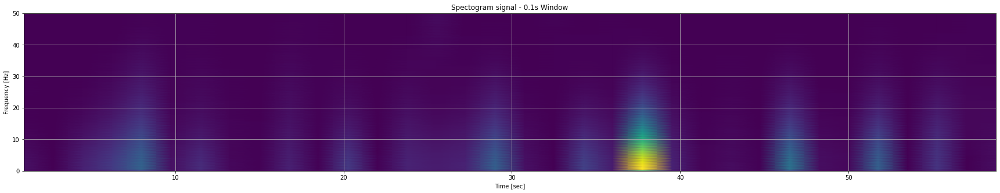

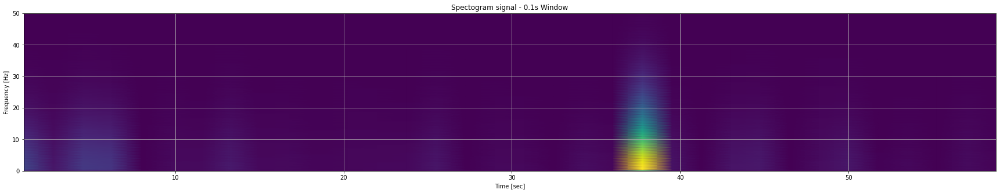

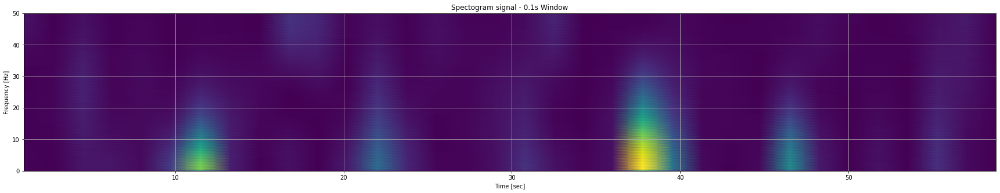

In [487]:
human = 3

for i in range(parts_amount):
  plot_and_find_ma(stimuled_humans, human, i)

# EXPERIENCE

In [78]:
exp_df = pd.read_csv('./data/demographics/self_report_nm15.csv')

exp_df.head(36)

print('Create music min:', min(exp_df['Create music']))
print('Create music max:', max(exp_df['Create music']))

print('Create music mean:', np.mean(exp_df['Create music']))



Create music min: 0.0
Create music max: 30.0
Create music mean: 4.976851851851852


In [17]:
# Correlation
young = [1,2,3,4,5,6,9,10]
old = [7,8]

h1 = 7
h2 = 5


n = 2

h1_part = stimuled_humans[h1][n]
h2_part = stimuled_humans[h2][n]

h1_another_part = stimuled_humans[h1][n+1]
h2_another_part = stimuled_humans[h2][n+1]

a = np.correlate(h1_part['dX'], h2_part['dX'])
b = np.correlate(h1_part['dX'], h1_another_part['dX'])
c = np.correlate(h1_part['dX'], h2_another_part['dX'])

print(stim_types[n], a,b,c)
print(np.mean(abs(h1_part['dX'])), np.mean(abs(h2_part['dX'])), '???',np.mean(abs(h1_another_part['dX'])),np.mean(abs(h2_another_part['dX'])) )

Meditation [0.041597] [0.513878] [0.139809]
0.02669766666666694 0.025624666666666258 ??? 0.030270833333333618 0.025577333333333514


In [18]:
a = np.correlate(h1_part['dX'], h2_part['dX'])
b = np.correlate(h1_part['dX'], h1_another_part['dX'])
c = np.correlate(h1_part['dX'], h2_another_part['dX'])


print(stim_types[n], a,b,c)
print(np.average(h1_part['dX']), np.average(h2_part['dX']), '???',np.average(h1_another_part['dX']),np.average(h2_another_part['dX']) )

Meditation [0.041597] [0.513878] [0.139809]
0.0014590000000000033 -0.00011600000000002334 ??? 0.002443499999999991 -0.0010626666666666627


In [82]:
musicians = [1,2,3,6,10]
not_musicians = [4,5,7,8,9]
file = '01'

young = [1,2,3,4,5,6,9,10]
old = [7,8]

group_1 = ['Under 25', young]
group_2 = ['After 26', old]

# group_1 = ['Musician', musicians]
# group_2 = ['Not musician', not_musicians]

# Find statistics for class of people
statistics = pd.DataFrame()
for m in range(1, markers[file]):
  for n in range(parts_amount):
    part = stimuled_humans[m][n]
    part_dict = {}

    for ax in range(len(axes)):
      part_dict[f'{axes[ax]}_mean'] = np.mean(abs(part[f'd{axes[ax]}']))
      part_dict[f'{axes[ax]}_std'] = np.std(abs(part[f'd{axes[ax]}']))
      part_dict[f'{axes[ax]}_var'] = np.std(abs(part[f'd{axes[ax]}'])) / np.mean(abs(part[f'd{axes[ax]}']))
      part_dict[f'{axes[ax]}_SoM'] = sum(abs(part[f'd{axes[ax]}'])) / 60

    part_dict['part'] = stim_types[n]
    part_dict['human'] = m

    if m in group_1[1]:
      part_dict['class'] = group_1[0]
      statistics = statistics.append(part_dict, ignore_index=True)
    elif m in group_2[1]:
      part_dict['class'] = group_2[0]
      statistics = statistics.append(part_dict, ignore_index=True)


In [83]:
statistics



,X_SoM,X_mean,X_std,X_var,Y_SoM,Y_mean,Y_std,Y_var,Z_SoM,Z_mean,Z_std,Z_var,class,human,part
0,NaN,0.037540,0.033309,0.887285,NaN,0.050823,0.042391,0.834080,NaN,0.019133,0.035427,1.851580,Under 25,1.0,Silence 1
1,4.313867,0.043139,0.035831,0.830594,6.614633,0.066146,0.054212,0.819582,2.252500,0.022525,0.050146,2.226249,Under 25,1.0,Middle Silence
2,4.468533,0.044685,0.041674,0.932603,5.738417,0.057384,0.049396,0.860792,2.073783,0.020738,0.045178,2.178514,Under 25,1.0,Meditation
3,3.686433,0.036864,0.031984,0.867604,5.561267,0.055613,0.047876,0.860892,1.859867,0.018599,0.038294,2.058977,Under 25,1.0,Salsa
4,4.092117,0.040921,0.037253,0.910350,5.414150,0.054142,0.045282,0.836363,1.848383,0.018484,0.031184,1.687072,Under 25,1.0,EDM
5,4.331383,0.043314,0.040005,0.923618,5.608500,0.056085,0.048167,0.858815,1.709917,0.017099,0.032565,1.904493,Under 25,1.0,Silence 2
6,NaN,0.042687,0.032660,0.765099,NaN,0.071107,0.052720,0.741421,NaN,0.012337,0.010916,0.884830,Under 25,2.0,Silence 1
7,4.056350,0.040563,0.032912,0.811361,6.335933,0.063359,0.049202,0.776551,1.464700,0.014647,0.017359,1.185127,Under 25,2.0,Middle Silence
8,3.876550,0.038765,0.030013,0.774215,5.601383,0.056014,0.045049,0.804257,1.305367,0.013054,0.012186,0.933513,Under 25,2.0,Meditation
9,3.751617,0.037516,0.031886,0.849932,6.239267,0.062393,0.052970,0.848977,1.297817,0.012978,0.012303,0.947954,Under 25,2.0,Salsa


In [84]:

# type = 'Silence 1'

music_or_not = {
  'music': {
    'X_mean': [],
    'X_std': [],

    'Y_mean': [],
    'Y_std': [],

    'Z_mean': [],
    'Z_std': []
  },
  'not': {
    'X_mean': [],
    'X_std': [],

    'Y_mean': [],
    'Y_std': [],

    'Z_mean': [],
    'Z_std': []
  },
}

for type_idx in range(6):
  # mus_sil = statistics[statistics['part'] == type][statistics['class'] == group_1[0]]
  # not_mus_sil = statistics[statistics['part'] == type][statistics['class'] == group_2[0]]

  mus_sil = statistics[statistics['part'] == stim_types[type_idx]][statistics['class'] == group_1[0]][statistics['part'] != 'Silence 1']
  not_mus_sil = statistics[statistics['part'] == stim_types[type_idx]][statistics['class'] == group_2[0]][statistics['part'] != 'Silence 1']

  group_names = [group_1[0], group_2[0]]
  # groups = [mus_edm, not_mus_edm]
  groups = [mus_sil, not_mus_sil]

  print(stim_types[type_idx], '++++++++++++++++++++++++++++++++++++++++++++++++++++')
  for group in range(len(groups)):
    print(f'========== {group_names[group]} ===========')
    for ax in axes:
      print(f'{ax}_mean: ', np.mean(groups[group][f'{ax}_mean']))
      print(f'{ax}_std: ', np.mean(groups[group][f'{ax}_std']))
      print(f'{ax}_var: ', np.mean(groups[group][f'{ax}_var']))
      print(f'{ax}_SoM: ', np.mean(groups[group][f'{ax}_SoM']))
      print(f'{ax}_SoM_std: ', np.std(groups[group][f'{ax}_SoM']))
      print(' --------------------')

      if(stim_types[type_idx] not in ['Silence 1', 'Silence 2', 'Middle Silence']):
        music_or_not['music'][f'{ax}_mean'].append( np.mean(groups[group][f'{ax}_SoM']))
        music_or_not['music'][f'{ax}_std'].append( np.std(groups[group][f'{ax}_SoM']))
      elif stim_types[type_idx] != 'Silence 1':
          if(np.mean(groups[group][f'{ax}_SoM'])):
            music_or_not['not'][f'{ax}_mean'].append( np.mean(groups[group][f'{ax}_SoM']))
            music_or_not['not'][f'{ax}_std'].append( np.std(groups[group][f'{ax}_SoM']))

Silence 1 ++++++++++++++++++++++++++++++++++++++++++++++++++++
========== Under 25 ===========
X_mean:  nan
X_std:  nan
X_var:  nan
X_SoM:  nan
X_SoM_std:  nan
 --------------------
Y_mean:  nan
Y_std:  nan
Y_var:  nan
Y_SoM:  nan
Y_SoM_std:  nan
 --------------------
Z_mean:  nan
Z_std:  nan
Z_var:  nan
Z_SoM:  nan
Z_SoM_std:  nan
 --------------------
========== After 26 ===========
X_mean:  nan
X_std:  nan
X_var:  nan
X_SoM:  nan
X_SoM_std:  nan
 --------------------
Y_mean:  nan
Y_std:  nan
Y_var:  nan
Y_SoM:  nan
Y_SoM_std:  nan
 --------------------
Z_mean:  nan
Z_std:  nan
Z_var:  nan
Z_SoM:  nan
Z_SoM_std:  nan
 --------------------
Middle Silence ++++++++++++++++++++++++++++++++++++++++++++++++++++
========== Under 25 ===========
X_mean:  0.037085291666666714
X_std:  0.0310561983955539
X_var:  0.8398573977989112
X_SoM:  3.708529166666672
X_SoM_std:  0.7536419235558528
 --------------------
Y_mean:  0.05400291666666672
Y_std:  0.043531129275861495
Y_var:  0.8044289397127429
Y_S

<ipython-input-84-14b3e81ad9ad>:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  mus_sil = statistics[statistics['part'] == stim_types[type_idx]][statistics['class'] == group_1[0]][statistics['part'] != 'Silence 1']
<ipython-input-84-14b3e81ad9ad>:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  not_mus_sil = statistics[statistics['part'] == stim_types[type_idx]][statistics['class'] == group_2[0]][statistics['part'] != 'Silence 1']


In [48]:
print("Music ------------------- ")
for ax in axes:
  print(f'{ax}_mean', round(np.mean(music_or_not['music'][f'{ax}_mean']),3), 'mm/s')
  print(f'{ax}_std', round(np.mean(music_or_not['music'][f'{ax}_std']), 3), 'mm/s')

print("Silence ------------------- ")
for ax in axes:
  print(f'{ax}_mean', round(np.mean(music_or_not['not'][f'{ax}_mean']), 3), 'mm/s')
  print(f'{ax}_std', round(np.mean(music_or_not['not'][f'{ax}_std']), 3), 'mm/s')

print(music_or_not['music'])


Music ------------------- 
X_mean 0.61 mm/s
X_std 0.092 mm/s
Y_mean 0.895 mm/s
Y_std 0.111 mm/s
Z_mean 0.25 mm/s
Z_std 0.067 mm/s
Silence ------------------- 
X_mean 0.632 mm/s
X_std 0.102 mm/s
Y_mean 0.937 mm/s
Y_std 0.112 mm/s
Z_mean 0.252 mm/s
Z_std 0.072 mm/s
{'X_mean': [0.6885961111111119, 0.537357777777773, 0.6730755555555534, 0.5314999999999966, 0.6935388888888852, 0.5380105555555469], 'X_std': [0.08496097652873354, 0.11111868892769917, 0.12171091898682557, 0.08830460285739612, 0.07399878087500925, 0.07171420829225944], 'Y_mean': [0.9635300000000051, 0.8450916666666688, 0.9605233333333301, 0.8295477777777732, 0.9193905555555599, 0.8507527777777775], 'Y_std': [0.05070112712118099, 0.10700311979125597, 0.10828646886047535, 0.1617962543382919, 0.1027008133540362, 0.1339162569193286], 'Z_mean': [0.24363833333334836, 0.24287555555555781, 0.2389322222222212, 0.23508722222221498, 0.2681449999999929, 0.2685677777777723], 'Z_std': [0.055910762187569074, 0.09717000761996247, 0.04118575178

In [37]:
group_names = [group_1[0], group_2[0]]
# groups = [mus_edm, not_mus_edm]
groups = [mus_sil, not_mus_sil]

music_or_not

print('Silence 2')
for group in range(len(groups)):
  print(f'========== {group_names[group]} ===========')
  for ax in axes:
    print(f'{ax}_mean: ', np.mean(groups[group][f'{ax}_mean']))
    print(f'{ax}_std: ', np.mean(groups[group][f'{ax}_std']))
    print(f'{ax}_var: ', np.mean(groups[group][f'{ax}_var']))
    print(' -------------------- ')

Silence 2
========== Musician ===========
X_mean:  0.04668603333333314
X_std:  0.040081644230666014
X_var:  0.8607833454917259
 -------------------- 
Y_mean:  0.06489206666666672
Y_std:  0.05501963151311475
Y_var:  0.8535020349163085
 -------------------- 
Z_mean:  0.01522736666666609
Z_std:  0.02273809699843083
Z_var:  1.4131018869621632
 -------------------- 
========== Not musician ===========
X_mean:  0.03331943333333398
X_std:  0.030687025587910442
X_var:  0.9068540845976081
 -------------------- 
Y_mean:  0.050838700000000125
Y_std:  0.03979848380069851
Y_var:  0.781291659827718
 -------------------- 
Z_mean:  0.014815433333333444
Z_std:  0.014803674125751088
Z_var:  0.9679895617933563
 -------------------- 


# FREQUENCY

No handles with labels found to put in legend.


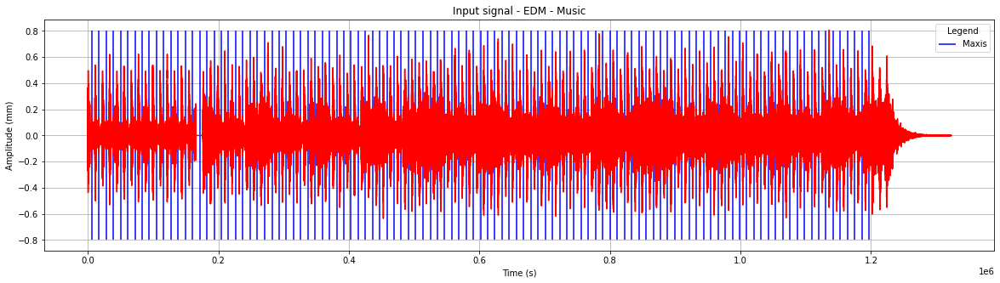

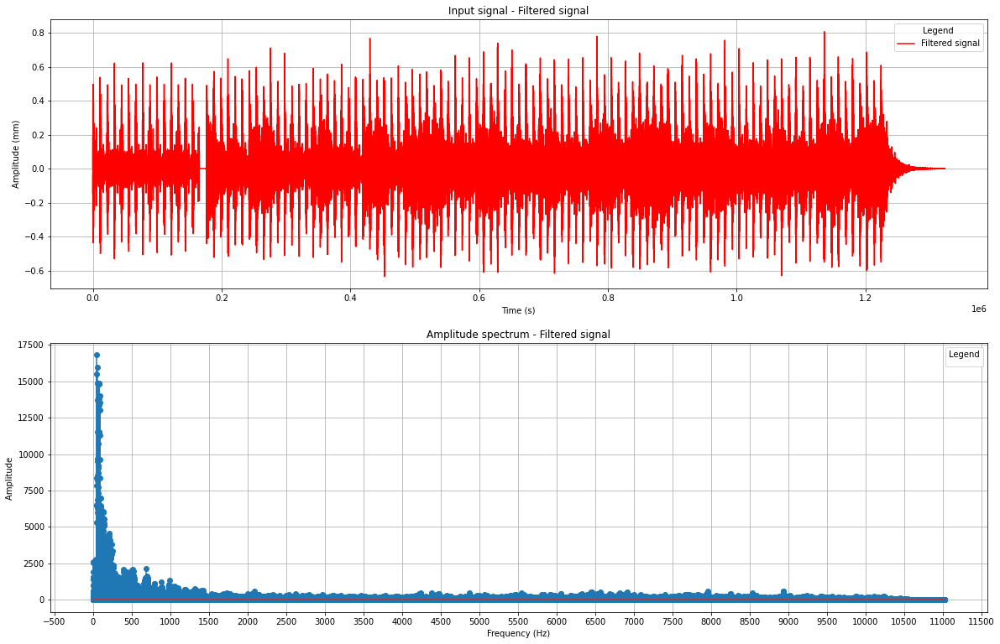

In [130]:

import librosa
import librosa.display

y, sr = librosa.load('./data/sound_data/still_stand_edm.wav')

tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


fig, axs = plt.subplots(  figsize=([20, 5]))
# plt.locator_params(axis='x', nbins=40)
axs.set_title(f'Input signal - EDM - Music')
axs.vlines(beat_times * sr, -0.8, 0.8, label='Maxis', color='b')
axs.plot(np.arange(sr * 60), y,  color = 'r')
# axs.plot(beat_times, ,  color = 'r', label='Filtered signal')

axs.set_xlabel('Time (s)')
axs.set_ylabel('Amplitude (mm)')
axs.legend(bbox_to_anchor=[1, 1],
              ncol=2, title="Legend")
axs.grid(True)


build_signal_fft(y, np.arange(sr * 60), 'Filtered signal',sr=sr,  ts=60)

Tempo: 117.45383522727273 BeatFrames [ 0.27863946  0.7662585   1.27709751  1.76471655  2.27555556  2.7631746
  3.27401361  3.76163265  4.27247166  4.78331066  5.27092971  5.78176871
  6.26938776  6.78022676  7.29106576  7.77868481  8.28952381  8.77714286
  9.28798186  9.77560091 10.28643991 10.77405896 11.28489796 11.77251701
 12.28335601 12.79419501 13.28181406 13.76943311 14.28027211 14.76789116
 15.27873016 15.78956916 16.30040816 16.78802721 17.29886621 17.78648526
 18.27410431 18.78494331 19.29578231 19.78340136 20.29424036 20.78185941
 21.29269841 21.78031746 22.29115646 22.77877551 23.28961451 23.80045351
 24.28807256 24.77569161 25.28653061 25.77414966 26.28498866 26.77260771
 27.28344671 27.79428571 28.28190476 28.79274376 29.28036281 29.79120181
 30.27882086 30.78965986 31.27727891 31.78811791 32.29895692 32.78657596
 33.29741497 33.78503401 34.29587302 34.78349206 35.29433107 35.78195011
 36.29278912 36.78040816 37.29124717 37.77886621 38.28970522 38.77732426
 39.28816327 39

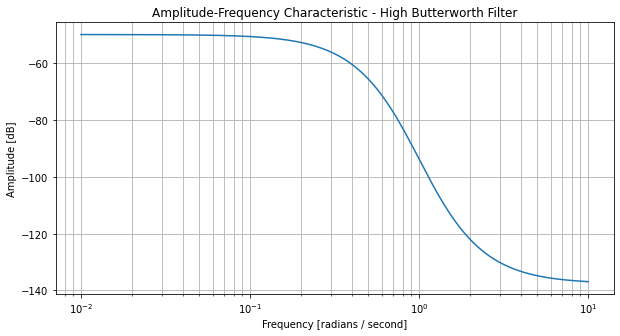

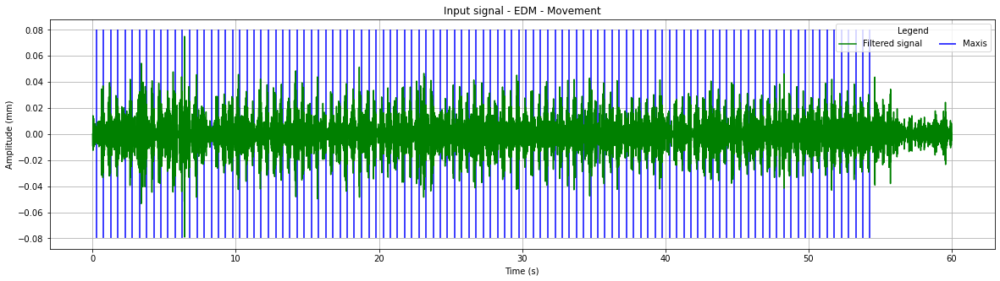

In [129]:



print('Tempo:', tempo, 'BeatFrames', beat_times, len(y))

i = 4

# Filter
# N, Wn = signal.buttord([0.1, 0.3], [0.05, 0.4], gpass=0.5, gstop=100)
# b, a = signal.butter(N, Wn, 'bandstop')

N, Wn = signal.buttord( wp=0.7, ws=0.8, gpass=3, gstop=60)
b, a = signal.butter(N, Wn, 'high')
build_afc(a, b, 'High Butterworth Filter')

y = signal.filtfilt(b, a, stimuled_humans[human][i]['dX'])
# build_signal_fft(y, stimuled_humans[human][i]['Time (s)'] - 240, 'Filtered signal',sr=100,  ts=60)
print(N, Wn)

fig, axs = plt.subplots(  figsize=([20, 5]))
# plt.locator_params(axis='x', nbins=40)
axs.set_title(f'Input signal - EDM - Movement')
axs.plot(stimuled_humans[human][i]['Time (s)'] - 240, y,  color = 'g', label='Filtered signal')
# axs.plot(beat_times, ,  color = 'r', label='Filtered signal')
axs.vlines(beat_times, -0.08, 0.08, label='Maxis', color='b')

axs.set_xlabel('Time (s)')
axs.set_ylabel('Amplitude (mm)')
axs.legend(bbox_to_anchor=[1, 1],
              ncol=2, title="Legend")
axs.grid(True)

# f, t, Sxx = signal.spectrogram(np.array(signals[i][0]), 100, window=('exponential', 0.2), nperseg=200)
# # f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))
# fig, axs = plt.subplots(1, 1,  figsize=([20, 5]))
# axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
# axs.pcolormesh(t, f, Sxx, shading='gouraud')
# axs.set_xlabel('Time [sec]')
# axs.set_ylabel('Frequency [Hz]')
# axs.grid(True)

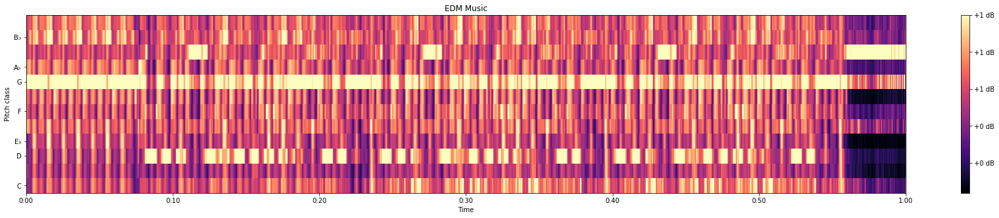

In [122]:
fig, ax = plt.subplots(figsize=([30, 5]))
chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
# img = librosa.display.specshow(S_db, x_axis='time', y_axis='linear', ax=ax)
img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time',
                               key='Eb:maj', ax=ax)
ax.set(title='EDM Music')
fig.colorbar(img, ax=ax, format="%+2.f dB")

Salsa


/home/botsula/.local/lib/python3.8/site-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")


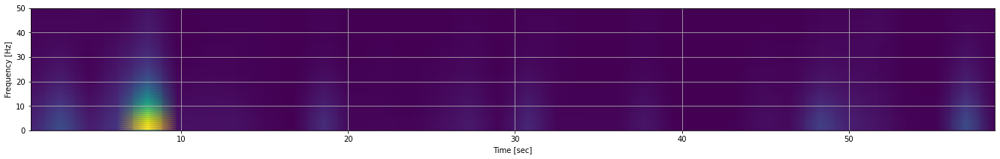

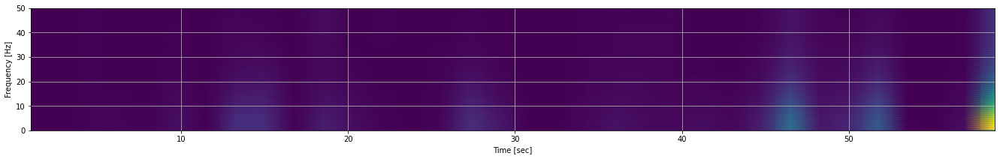

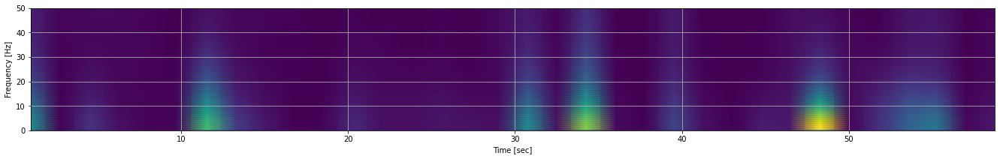

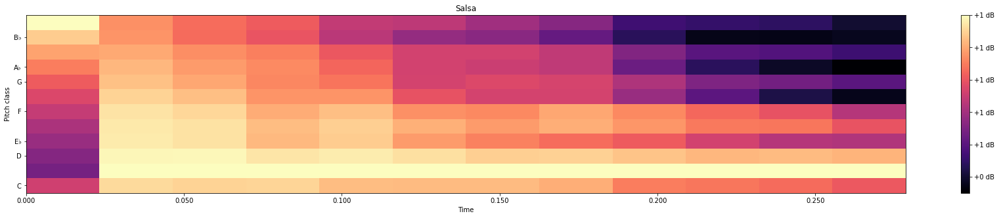

In [107]:
# fig, ax = plt.subplots(figsize=([30, 5]))
# chroma = librosa.feature.chroma_cqt(y=np.array(stimuled_humans[2][4]['dX']), sr=100)
# # img = librosa.display.specshow(S_db, x_axis='time', y_axis='linear', ax=ax)
# img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time',
#                                key='Eb:maj', ax=ax)
# ax.set(title='Now with labeled axes!')
# fig.colorbar(img, ax=ax, format="%+2.f dB")

type_idx = 3


f, t, Sxx = signal.spectrogram(np.array(stimuled_humans[1][type_idx]['dX']), 100, window=('exponential', 0.2), nperseg=200)
# f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))

fig, axs = plt.subplots(1, 1,  figsize=([23, 3]))
# axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
axs.pcolormesh(t, f, Sxx, shading='gouraud')
axs.set_xlabel('Time [sec]')
axs.set_ylabel('Frequency [Hz]')
axs.grid(True)


f, t, Sxx = signal.spectrogram(np.array(stimuled_humans[2][type_idx]['dX']), 100, window=('exponential', 0.2), nperseg=200)
# f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))

fig, axs = plt.subplots(1, 1,  figsize=([23, 3]))
# axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
axs.pcolormesh(t, f, Sxx, shading='gouraud')
axs.set_xlabel('Time [sec]')
axs.set_ylabel('Frequency [Hz]')
axs.grid(True)

f, t, Sxx = signal.spectrogram(np.array(stimuled_humans[6][type_idx]['dX']), 100, window=('exponential', 0.2), nperseg=200)
# f, t, Sxx = signal.spectrogram(np.array(signals[i][0]))

fig, axs = plt.subplots(1, 1,  figsize=([23, 3]))
# axs.set_title(f'Spectogram signal - {stim_types[i]} X - Human {human}')
axs.pcolormesh(t, f, Sxx, shading='gouraud')
axs.set_xlabel('Time [sec]')
axs.set_ylabel('Frequency [Hz]')
axs.grid(True)


fig, ax = plt.subplots(figsize=([30, 5]))
chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
# img = librosa.display.specshow(S_db, x_axis='time', y_axis='linear', ax=ax)
img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time',
                               key='Eb:maj', ax=ax)
ax.set(title=stim_types[type_idx])
fig.colorbar(img, ax=ax, format="%+2.f dB")


print(stim_types[type_idx])

In [400]:
stimuled_humans[2][\4 4]['dX']

24000    0.090
24001    0.084
24002    0.118
24003    0.076
24004    0.107
         ...  
29995   -0.063
29996   -0.070
29997   -0.093
29998   -0.079
29999   -0.094
Name: dX, Length: 6000, dtype: float64

[Text(0.5, 1.0, 'MFCC')]

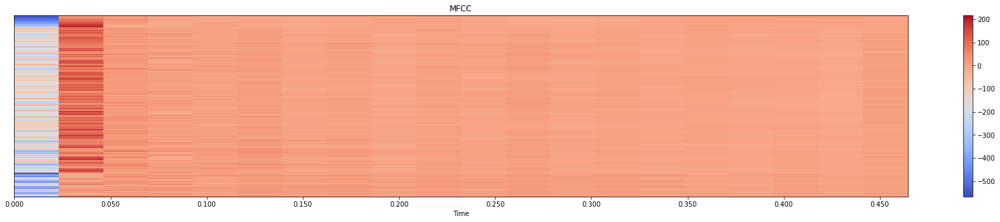

In [435]:
# n_mfcc = 40
n_fft = 2048
hop_length = 512
num_seggments = 5

# tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
# beat_times = librosa.frames_to_time(beat_frames, sr=sr)

# D = librosa.stft(y)  # STFT of y
# S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# print('Tempo:', tempo, 'BeatFrames', beat_frames)

mfcc = librosa.feature.mfcc(y=y,
                            sr=sr)
# mfcc.shape
mfcc = mfcc.T
# mel_array.append(mfcc)

fig, ax = plt.subplots(figsize=([30, 5]))
img = librosa.display.specshow(mfcc, x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

In [87]:
60 * 100

6000